**U –NET**
The network is based on the fully convolutional network and its architecture was modified and extended to work with fewer training images and to yield more precise segmentations. 
The main idea is to supplement a usual contracting network by successive layers, where pooling operations are replaced by upsampling operators. Hence these layers increase the resolution of the output. What's more, a successive convolutional layer can then learn to assemble a precise output based on this information.
The network consists of a contracting path and an expansive path, which gives it the u-shaped architecture. The contracting path is a typical convolutional network that consists of repeated application of convolutions, each followed by ReLU and a max pooling operation. 

**FPN**
Feature Pyramid Network (FPN) is a feature extractor designed for such pyramid concept with accuracy and speed in mind. It replaces the feature extractor of detectors like Faster R-CNN and generates multiple feature map layers (multi-scale feature maps) with better quality information than the regular feature pyramid for object detection.
FPN composes of a bottom-up and a top-down pathway. The bottom-up pathway is the usual convolutional network for feature extraction. As we go up, the spatial resolution decreases. With more high-level structures detected, the semantic value for each layer increases.

**PAN**
A Pyramid Attention Network (PAN) is proposed to exploit the impact of global contextual information in semantic segmentation. Different from most existing works, we combine attention mechanism and spatial pyramid to extract precise dense features for pixel labeling instead of complicated dilated convolution and artificially designed decoder networks. Specifically, we introduce a Feature Pyramid Attention module to perform spatial pyramid attention structure on high-level output and combining global pooling to learn a better feature representation, and a Global Attention Upsample module on each decoder layer to provide global context as a guidance of low-level features to select category localization details.

**DeepLabv3**
DeepLabv3 is a semantic segmentation architecture that improves upon DeepLabv2 with several modifications. To handle the problem of segmenting objects at multiple scales, modules are designed which employ atrous convolution in cascade or in parallel to capture multi-scale context by adopting multiple atrous rates. Furthermore, the Atrous Spatial Pyramid Pooling module from DeepLabv2 augmented with image-level features encoding global context and further boost performance.


In [ ]:
import os
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from skimage.io import imread
import matplotlib.pyplot as plt
import cv2
import random
from datetime import datetime
import json
import gc
import torch
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
import torch.backends.cudnn as cudnn
import torch.backends.cudnn
from torch.autograd import Variable
from torchvision.transforms import ToTensor, Normalize, Compose

from tqdm import tqdm
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
#from google.colab import drive
import torch.nn.functional as F
import torchvision
# import keras
from keras.datasets import mnist
%matplotlib inline
from PIL import Image
import albumentations as A
from sklearn.model_selection import train_test_split
from skimage.morphology import binary_opening, disk, label

Dataset class for the dataloader

In [ ]:
class ShipDataset(torch.utils.data.Dataset):
    def __init__(self,in_df,root_path,transforms=None):
        imagesIds = in_df['ImageId'].tolist()
        self.image_ids =  list(set(imagesIds))
        self.in_df = in_df
        self.root_path = root_path
        self.transforms = transforms
        
    def __len__(self):
        return len(self.image_ids)
    
    def __getitem__(self,idx):
        ImageId = self.image_ids[idx]
        img = cv2.imread(self.root_path + "/"+ ImageId)
        img_masks = self.in_df.loc[self.in_df['ImageId'] == ImageId, 'EncodedPixels'].tolist()
        all_masks = np.zeros((768, 768))
        for mask in img_masks:
            all_masks += rle_decode(mask)
        
        #all_masks = np.expand_dims(all_masks,axis=0)
        if self.transforms is not None:
            img = self.transforms(img)
            all_masks = self.transforms(all_masks)

        return img.float(), all_masks.float()

In [ ]:
def multi_rle_encode(img, **kwargs):
    '''
    Encode connected regions as separated masks
    '''
    labels = label(img)
    if img.ndim > 2:
        return [rle_encode(np.sum(labels==k, axis=2), **kwargs) for k in np.unique(labels[labels>0])]
    else:
        return [rle_encode(labels==k, **kwargs) for k in np.unique(labels[labels>0])]

In [ ]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros([shape[0]*shape[1],1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

read data from csv

In [ ]:
submission = pd.read_csv('../input/airbus-ship-detection/train_ship_segmentations_v2.csv')
submission = submission.dropna()

In [ ]:
unique_img_ids = submission.groupby('ImageId').size().reset_index(name='counts')
train_ids, valid_ids = train_test_split(unique_img_ids, 
                 test_size = 0.2, 
                 stratify = unique_img_ids['counts'],
                 random_state=42
                )
train_df = pd.merge(submission, train_ids)
valid_df = pd.merge(submission, valid_ids)
print(train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

65373 training masks
16350 validation masks


In [ ]:
train_df = train_df[:1200]
valid_df = valid_df[:300]

In [ ]:
!pip install -U segmentation-models-pytorch albumentations --user

In [ ]:
!pip install -U git+https://github.com/albu/albumentations > /dev/null
# !pip install torchmetrics timm
import torchmetrics 
# import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-x3ees40e


In [ ]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor() 
])

train_set = ShipDataset(train_df,"../input/airbus-ship-detection/train_v2",transforms=transforms)
val_set = ShipDataset(valid_df,"../input/airbus-ship-detection/train_v2",transforms=transforms)

train_loader = torch.utils.data.DataLoader(train_set, batch_size=4, shuffle=True, num_workers=8)
valid_loader = torch.utils.data.DataLoader(val_set, batch_size=4, shuffle=False, num_workers=8)

load u-net from pytorch

In [ ]:
import segmentation_models_pytorch as smp
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation

model_unet = smp.Unet(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,                      # model output channels (number of classes in your dataset)
    activation=ACTIVATION
)
model_unet = model_unet.cuda()

In [ ]:
loss = smp.utils.losses.DiceLoss()
optimizer = torch.optim.AdamW([ 
    dict(params=model_unet.parameters(), lr=0.0004)
])
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Accuracy()
]

DEVICE = 'cuda'

create train and valid functions

In [ ]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model_unet, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model_unet, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

training the u-net

In [ ]:
# train model for 30 epochs

max_score = 0
for i in range(0, 30):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    if (i+1)%7 == 0:
        optimizer.param_groups[0]['lr'] *= 0.5
        print(optimizer.param_groups[0]['lr'])
#     if i>=30 and (i+1)%4 == 0:
#         optimizer.param_groups[0]['lr'] *= 0.5
#         print(optimizer.param_groups[0]['lr'])
    torch.cuda.empty_cache()
#     if 
#     torch.save(model, './'+model_name+'_epoch_'+str(i)+'_'+str(time.time())+'.pth')
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model_unet, './best_model_unet.pth')
        print('Model saved!')


Epoch: 0
valid: 100%|██████████| 36/36 [00:08<00:00,  4.03it/s, dice_loss - 0.9548, iou_score - 0.04523, accuracy - 0.8171]
Model saved!

Epoch: 1
valid: 100%|██████████| 36/36 [00:08<00:00,  4.26it/s, dice_loss - 0.7392, iou_score - 0.1985, accuracy - 0.9956]
Model saved!

Epoch: 2
valid: 100%|██████████| 36/36 [00:08<00:00,  4.13it/s, dice_loss - 0.6198, iou_score - 0.2703, accuracy - 0.9935]
Model saved!

Epoch: 3
valid: 100%|██████████| 36/36 [00:08<00:00,  4.26it/s, dice_loss - 0.5701, iou_score - 0.3071, accuracy - 0.9926]
Model saved!

Epoch: 4
valid: 100%|██████████| 36/36 [00:08<00:00,  4.06it/s, dice_loss - 0.611, iou_score - 0.2769, accuracy - 0.993]  

Epoch: 5
valid: 100%|██████████| 36/36 [00:08<00:00,  4.12it/s, dice_loss - 0.6741, iou_score - 0.2265, accuracy - 0.9957]

Epoch: 6
valid: 100%|██████████| 36/36 [00:08<00:00,  4.18it/s, dice_loss - 0.5897, iou_score - 0.2919, accuracy - 0.9938]
0.0002

Epoch: 7
valid: 100%|██████████| 36/36 [00:08<00:00,  4.16it/s, dice_lo

In [ ]:
best_model = torch.load("./best_model_fpn.pth")

load FPN model from pytorch

In [ ]:
import segmentation_models_pytorch as smp
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation

model_FPN = smp.FPN(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,                      # model output channels (number of classes in your dataset)
    activation=ACTIVATION
)
model_FPN = model_FPN.cuda()

In [ ]:
loss = smp.utils.losses.DiceLoss()
optimizer = torch.optim.AdamW([ 
    dict(params=model_FPN.parameters(), lr=0.00001)
])
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

DEVICE = 'cuda'

In [ ]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model_FPN, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model_FPN, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

training FPN model

In [ ]:
# train model for 30 epochs

max_score = 0
for i in range(0, 30):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    if (i+1)%7 == 0:
        optimizer.param_groups[0]['lr'] *= 0.2
        print(optimizer.param_groups[0]['lr'])
    torch.cuda.empty_cache()
#     # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model_FPN, './best_model_fpn.pth')
        print('Model saved!')


Epoch: 0
valid: 100%|██████████| 36/36 [00:06<00:00,  5.25it/s, dice_loss - 0.5371, iou_score - 0.3545]
Model saved!

Epoch: 1
valid: 100%|██████████| 36/36 [00:06<00:00,  5.21it/s, dice_loss - 0.4874, iou_score - 0.3887]
Model saved!

Epoch: 2
valid: 100%|██████████| 36/36 [00:06<00:00,  5.18it/s, dice_loss - 0.4582, iou_score - 0.4143]
Model saved!

Epoch: 3
valid: 100%|██████████| 36/36 [00:06<00:00,  5.37it/s, dice_loss - 0.4581, iou_score - 0.4112]

Epoch: 4
valid: 100%|██████████| 36/36 [00:06<00:00,  5.32it/s, dice_loss - 0.4466, iou_score - 0.4243]
Model saved!

Epoch: 5
valid: 100%|██████████| 36/36 [00:06<00:00,  5.40it/s, dice_loss - 0.391, iou_score - 0.4797] 
Model saved!

Epoch: 6
valid: 100%|██████████| 36/36 [00:06<00:00,  5.42it/s, dice_loss - 0.4048, iou_score - 0.4647]
2.0000000000000003e-06

Epoch: 7
valid: 100%|██████████| 36/36 [00:06<00:00,  5.40it/s, dice_loss - 0.3978, iou_score - 0.4746]

Epoch: 8
valid: 100%|██████████| 36/36 [00:06<00:00,  5.43it/s, dice_lo

load PAN model from pytorch

In [ ]:
import segmentation_models_pytorch as smp
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multicalss segmentation

model_PAN = smp.PAN(
    encoder_name="resnet50",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,                      # model output channels (number of classes in your dataset)
    activation=ACTIVATION
)
model_PAN = model_PAN.cuda()

In [ ]:
loss = smp.utils.losses.DiceLoss()
optimizer = torch.optim.AdamW([ 
    dict(params=model_PAN.parameters(), lr=0.0001)
])
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

DEVICE = 'cuda'

In [ ]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor() 
])

train_set = ShipDataset(train_df,"../input/airbus-ship-detection/train_v2",transforms=transforms)
val_set = ShipDataset(valid_df,"../input/airbus-ship-detection/train_v2",transforms=transforms)

train_loader = torch.utils.data.DataLoader(train_set, batch_size=4, shuffle=True, num_workers=8)
valid_loader = torch.utils.data.DataLoader(val_set, batch_size=4, shuffle=False, num_workers=4)

In [ ]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model_PAN, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model_PAN, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

training PAN model

In [ ]:
# train model for 30 epochs

max_score = 0
for i in range(0, 30):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    if (i+1)%7 == 0:
        optimizer.param_groups[0]['lr'] *= 0.2
        print(optimizer.param_groups[0]['lr'])
    torch.cuda.empty_cache()
#     # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model_PAN, './best_model_pan.pth')
        print('Model saved!')

vizualization function

In [ ]:
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()


vizualize FPN model train predictions

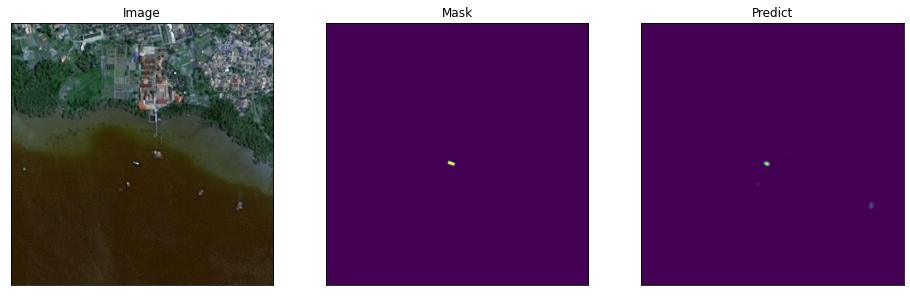

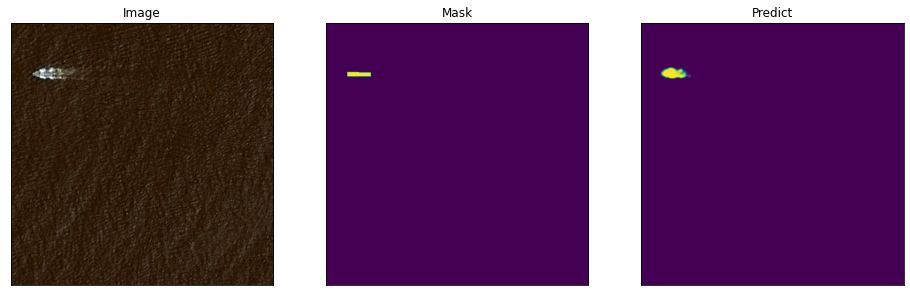

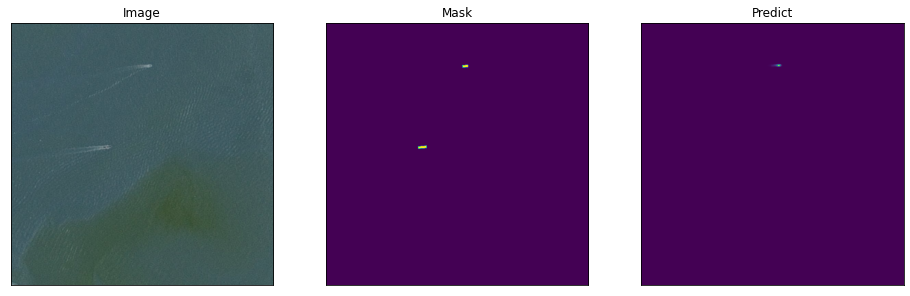

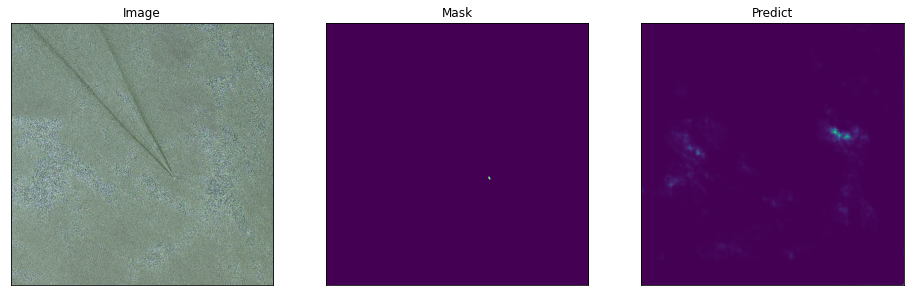

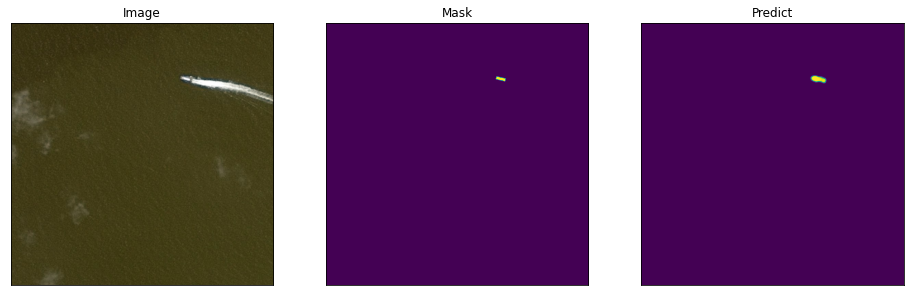

...

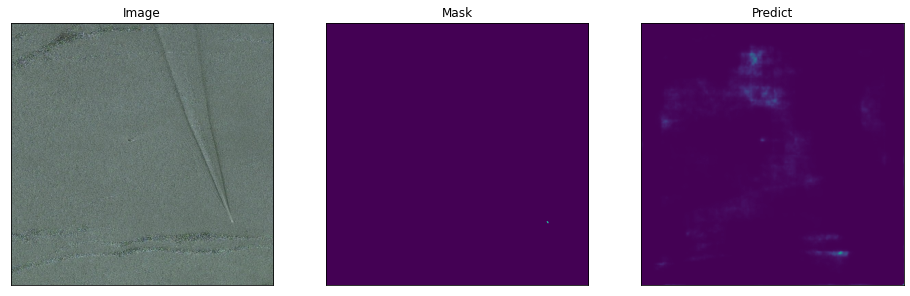

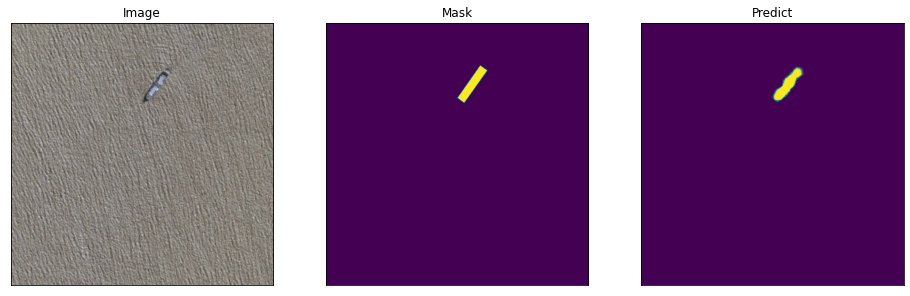

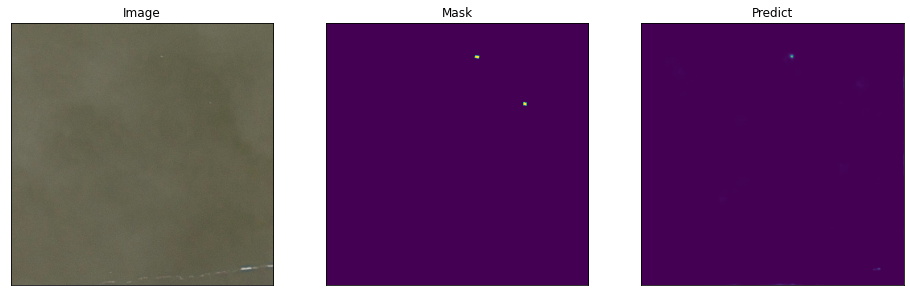

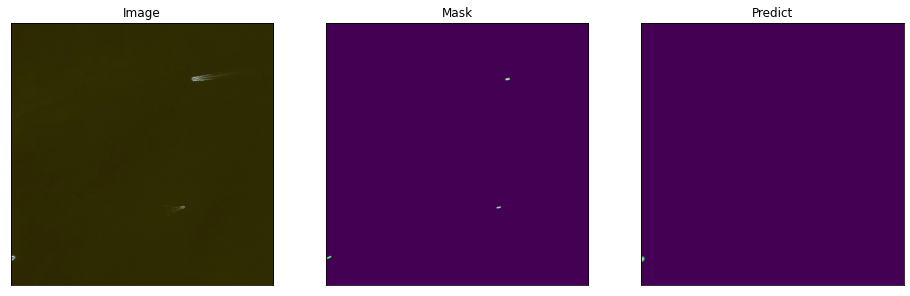

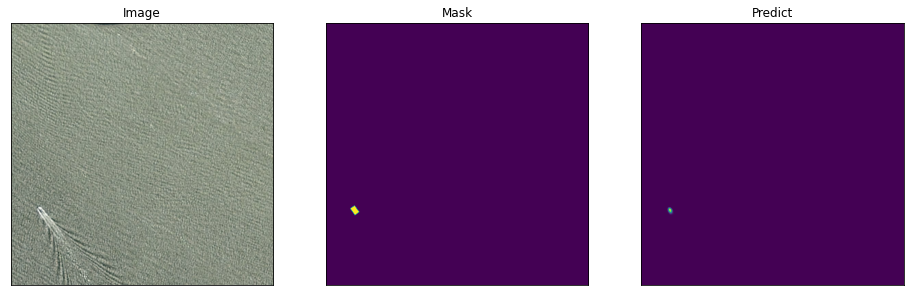

In [ ]:
valid_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)
test = iter(valid_loader)

for i in range(20):
    img,mask = next(test)
    pred = model_FPN(img.cuda())
    pred = pred.detach().cpu().double()
    visualize(
    image=img.squeeze().permute(1,2,0),
    mask = mask.squeeze(),
    Predict=pred.squeeze(),
    )

vizualize FPN model validation predictions

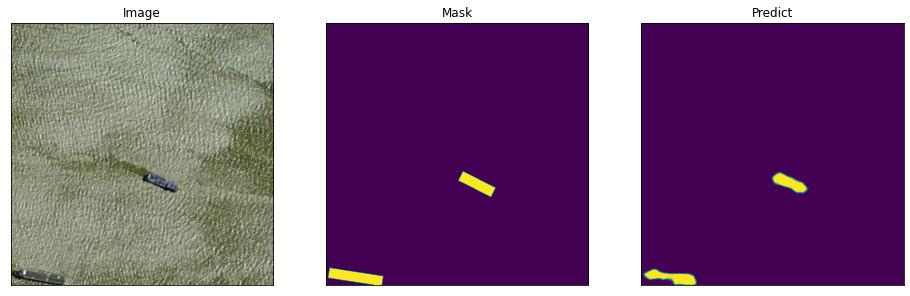

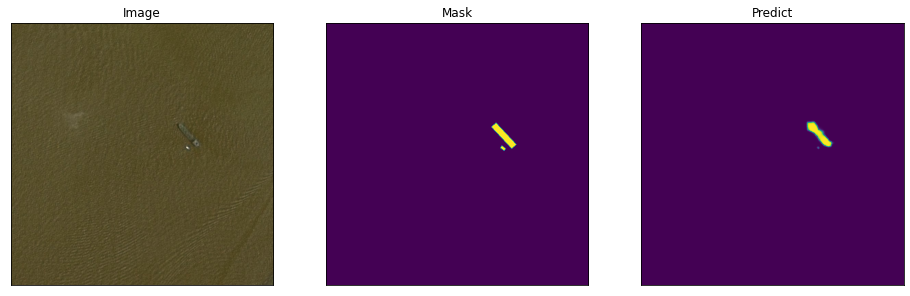

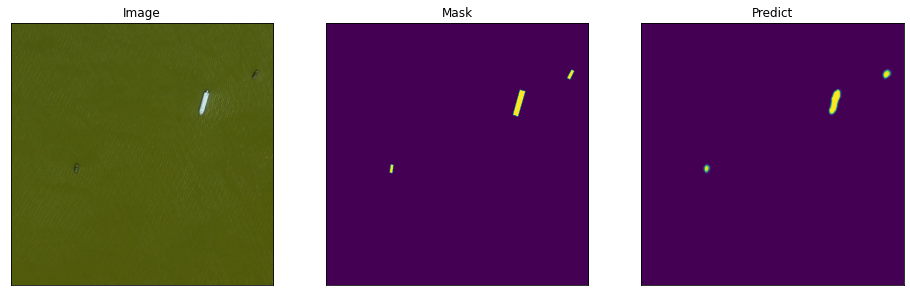

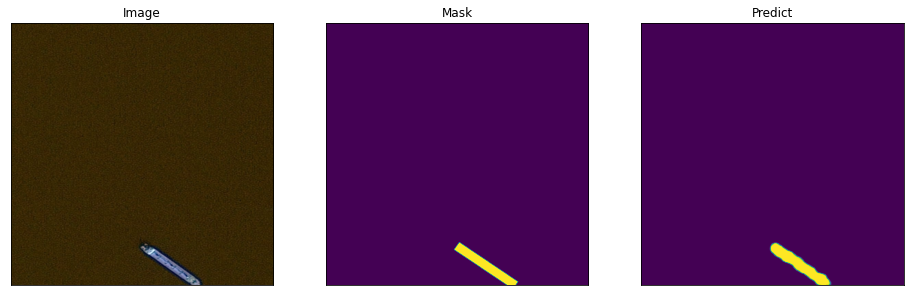

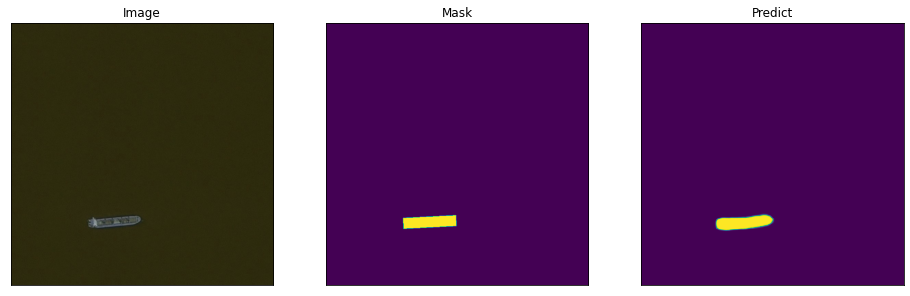

...

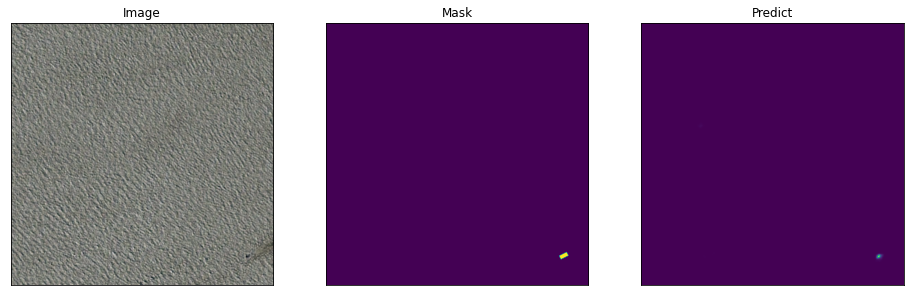

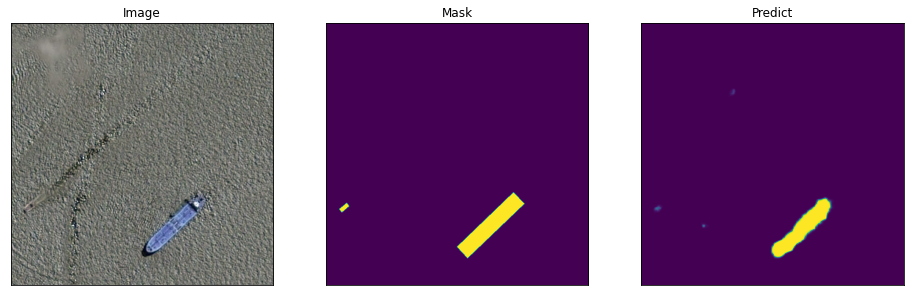

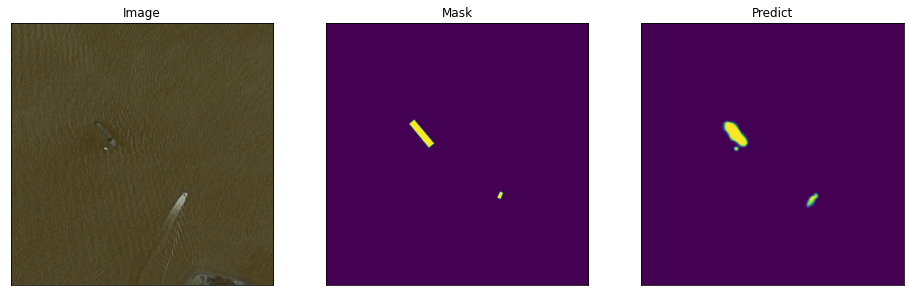

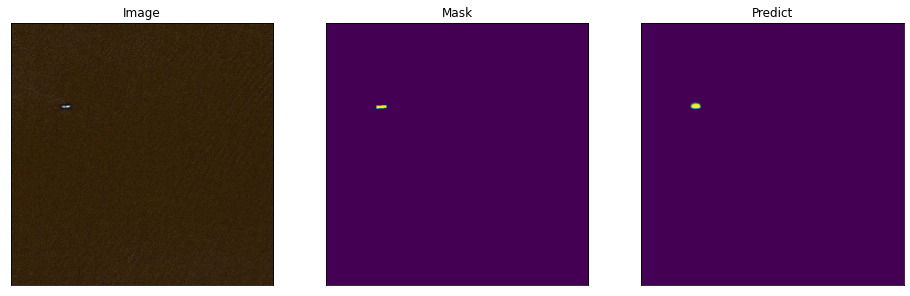

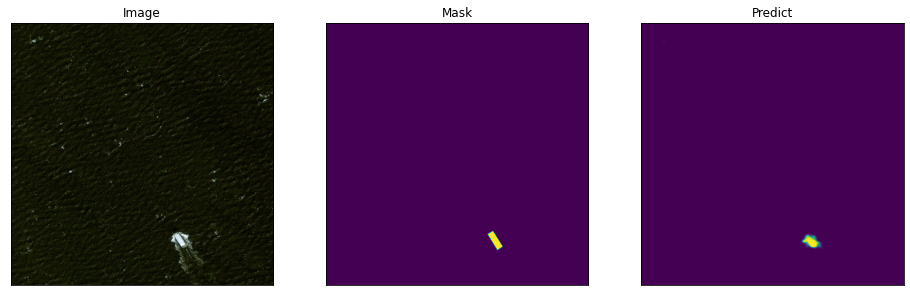

In [ ]:
valid_loader = torch.utils.data.DataLoader(val_set, batch_size=1, shuffle=True, num_workers=2)
test = iter(valid_loader)

for i in range(20):
    img,mask = next(test)
    pred = model_FPN(img.cuda())
    pred = pred.detach().cpu().double()
    visualize(
    image=img.squeeze().permute(1,2,0),
    mask = mask.squeeze(),
    Predict=pred.squeeze(),
    )

vizualize U-Net model train predictions

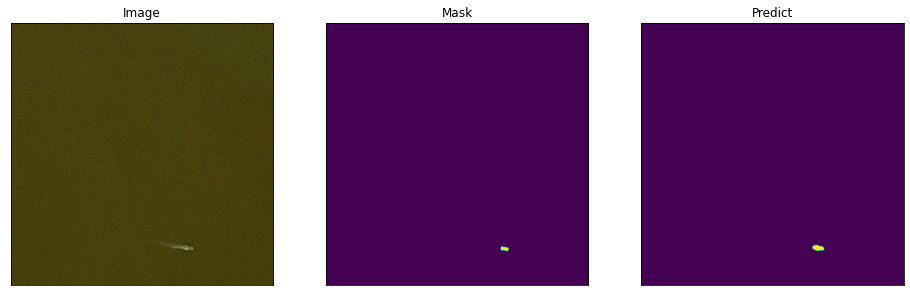

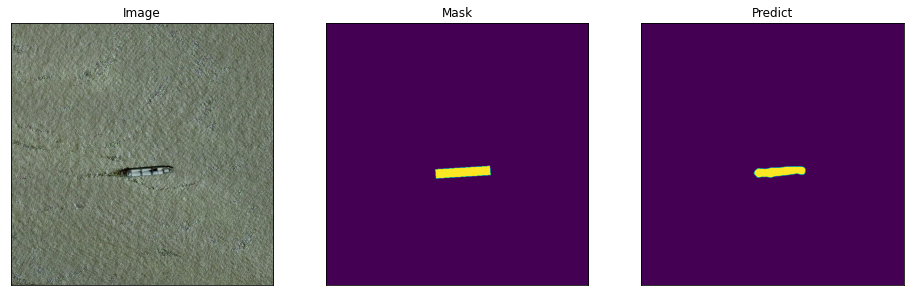

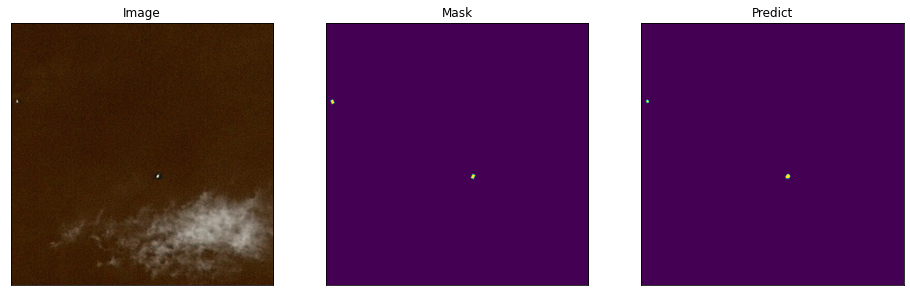

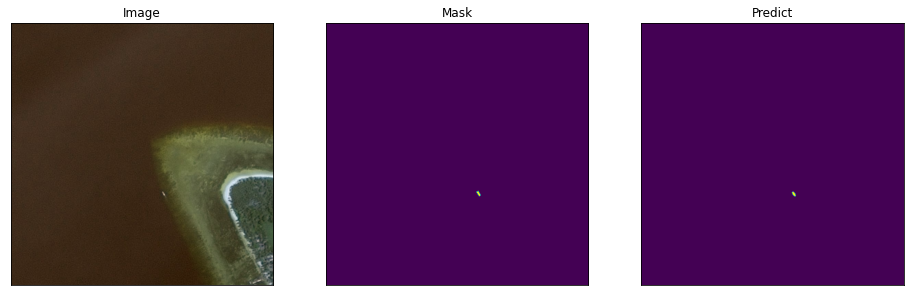

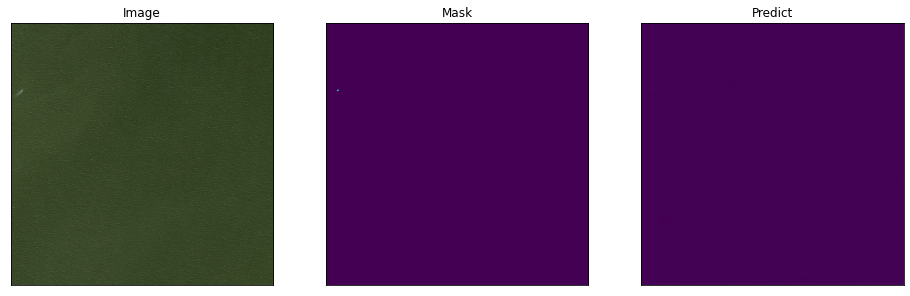

...

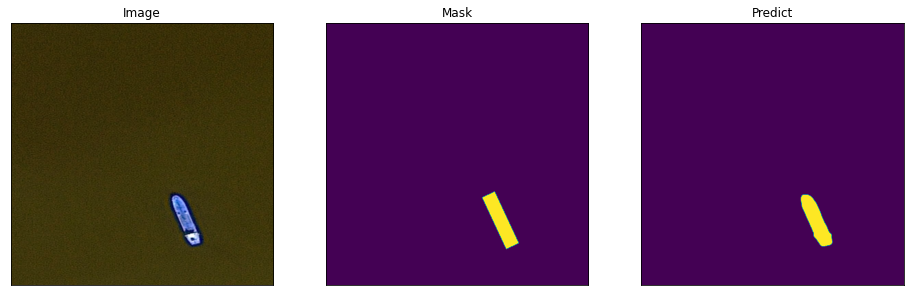

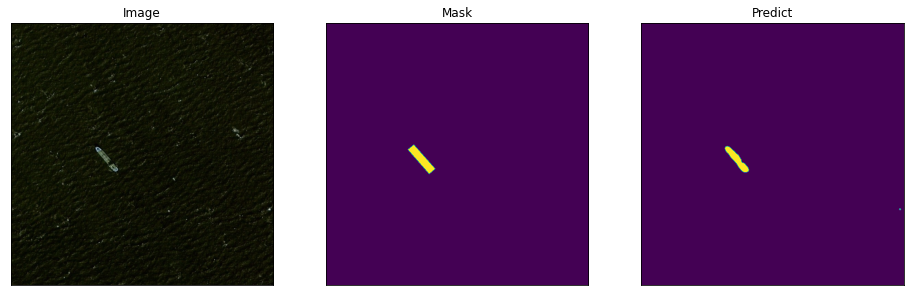

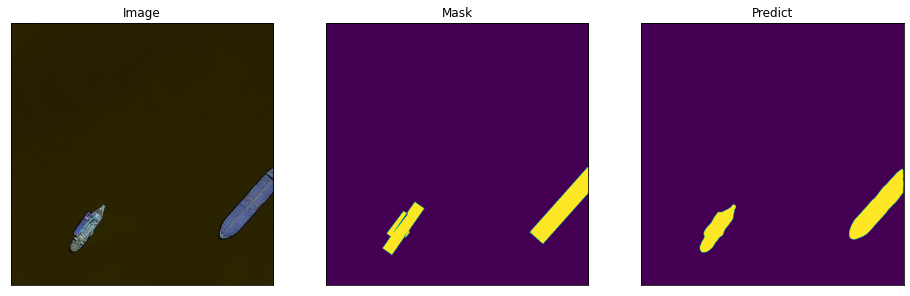

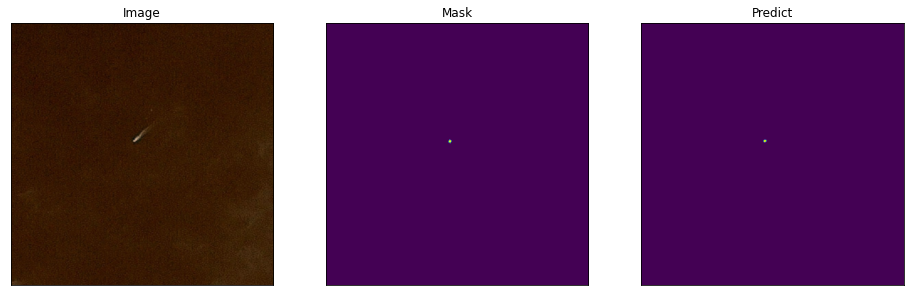

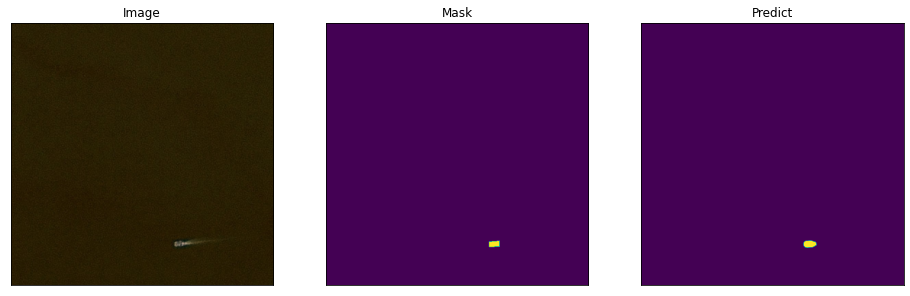

In [ ]:
valid_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)
test = iter(valid_loader)

for i in range(20):
    img,mask = next(test)
    pred = model_unet(img.cuda())
    pred = pred.detach().cpu().double()
    visualize(
    image=img.squeeze().permute(1,2,0),
    mask = mask.squeeze(),
    Predict=pred.squeeze(),
    )

vizualize U-Net model validation predctions

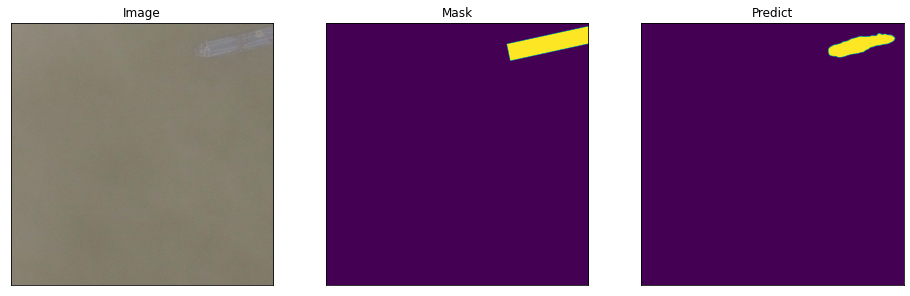

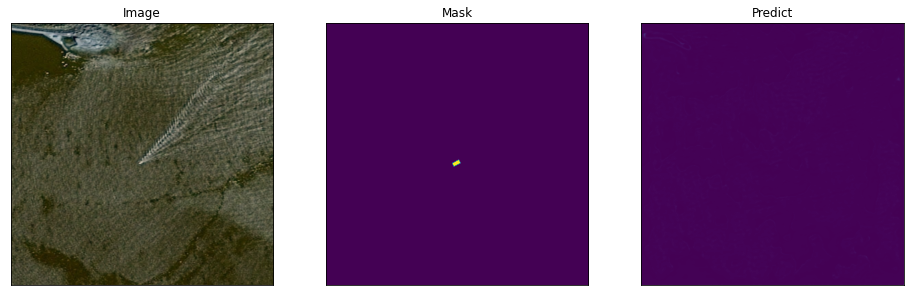

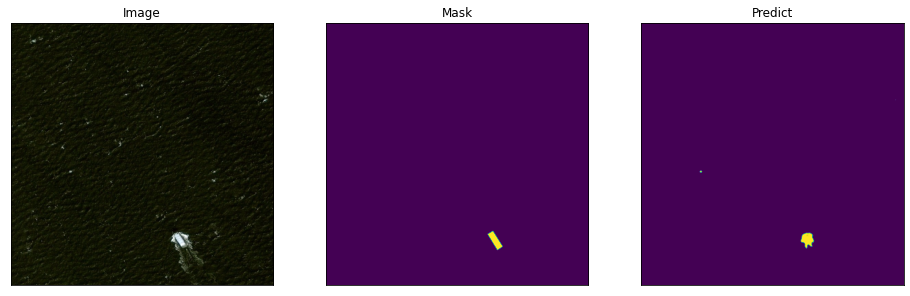

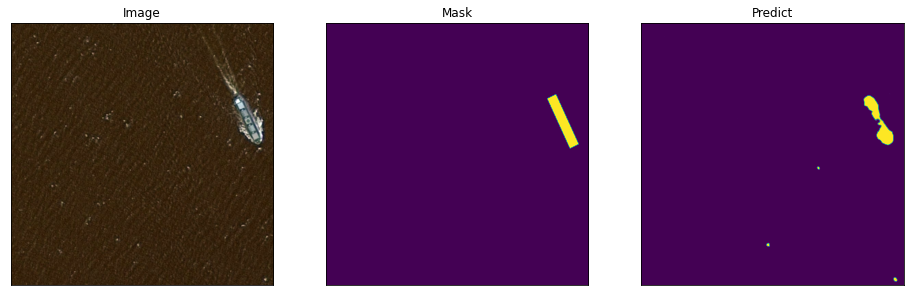

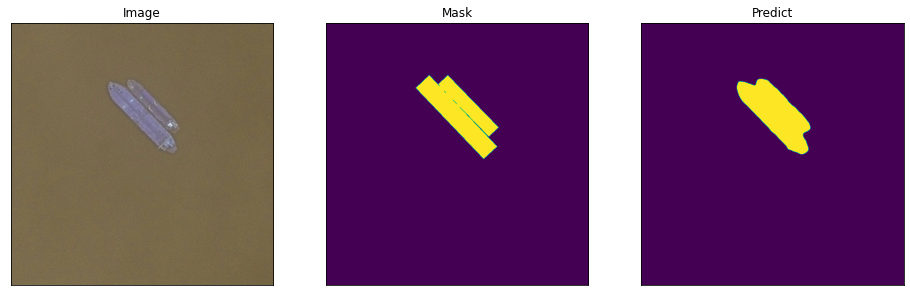

...

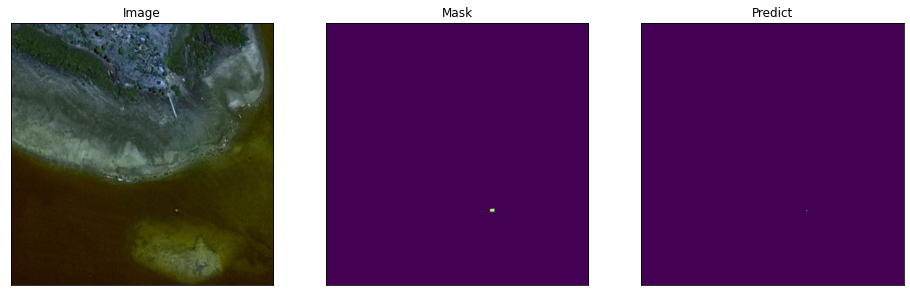

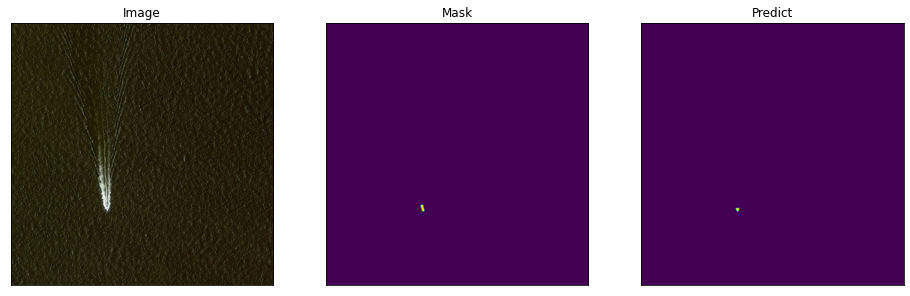

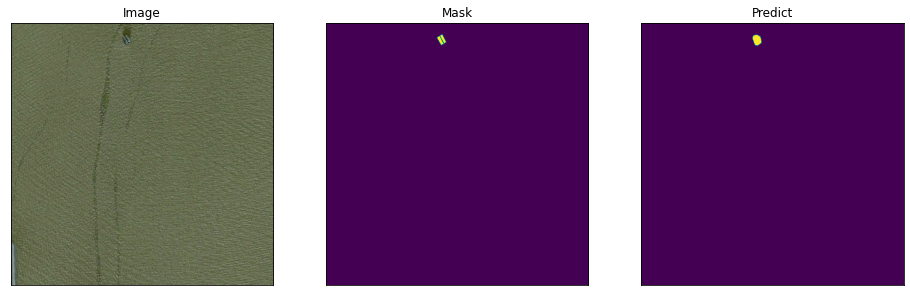

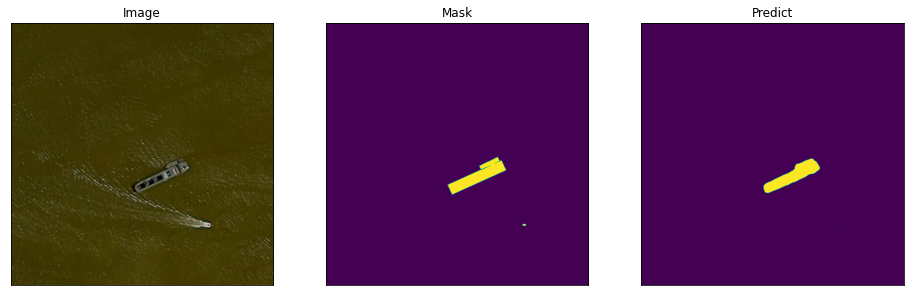

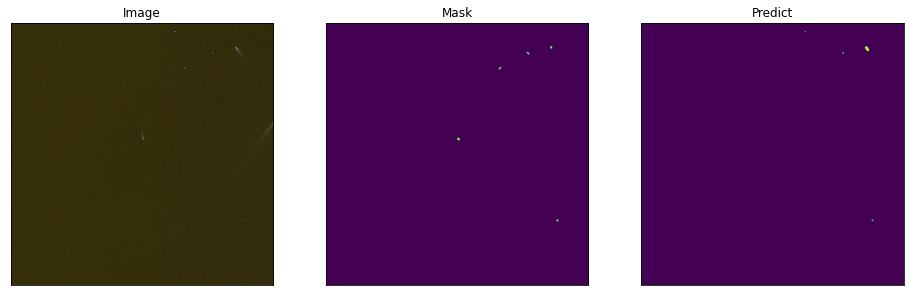

In [ ]:
valid_loader = torch.utils.data.DataLoader(val_set, batch_size=1, shuffle=True, num_workers=2)
test = iter(valid_loader)

for i in range(20):
    img,mask = next(test)
    pred = model_unet(img.cuda())
    pred = pred.detach().cpu().double()
    visualize(
    image=img.squeeze().permute(1,2,0),
    mask = mask.squeeze(),
    Predict=pred.squeeze(),
    )

submission

In [ ]:
def pred_image_from_path_encode(root_path,image_names,model,device):
    out_pred_rows = []
    for img_name in image_names:
        c_img = Image.open(root_path+"/"+img_name)
        covnertTensor = torchvision.transforms.transforms.ToTensor()
        c_img = covnertTensor(c_img)
        c_img = c_img.unsqueeze(0)
        if device == 'cuda':
            c_img = c_img.cuda()
        cur_seg = model(c_img)
        cur_seg = cur_seg.squeeze(0).squeeze(0).detach().cpu().numpy()
        cur_seg[cur_seg < 0.5] = 0 
        cur_seg[cur_seg >= 0.5] = 1
        cur_rles = multi_rle_encode(cur_seg,max_mean_threshold=1.0)
        if len(cur_rles)>0:
            for c_rle in cur_rles:
                out_pred_rows += [{'ImageId': img_name, 'EncodedPixels': c_rle}]
        else:
            out_pred_rows += [{'ImageId': img_name, 'EncodedPixels': None}]
    
    return out_pred_rows

In [ ]:
test_image_dir = "../input/airbus-ship-detection/test_v2"
images_names = np.array(os.listdir(test_image_dir))
print(images_names)
print(len(images_names), 'test images found')
out_pred_rows = pred_image_from_path_encode(test_image_dir,images_names,model_FPN,DEVICE)
sub = pd.DataFrame(out_pred_rows)
sub.columns = ['ImageId', 'EncodedPixels']
#sub = sub[sub.EncodedPixels.notnull()]

['4291f3a66.jpg' 'b0808caaf.jpg' '9f582d5ce.jpg' ... '98b35319c.jpg'
 'da705c5a9.jpg' '1dea3dda3.jpg']
15606 test images found


In [ ]:
sub.to_csv('submission.csv', index=False)